# 01. Installing Bioconductor and finding help

- Edx 자료 - PH525x series - Biomedical Data Science ( http://genomicsclass.github.io/book )
- Jupyter와 R 연동 방법 : http://www.walkingrandomly.com/?p=5734 

## Installing Bioconductor

- Bioconductor을 R의 버전별로 설치하는 방식이 다르기 때문에  http://bioconductor.org/biocLite.R 스크립트를 만들어서 제공하고 있음.
- source 명령어로 해당 스크립트를 실행하면 버전에 맞게 설치가 이루어짐.

In [2]:
source("http://bioconductor.org/biocLite.R")

Bioconductor version 3.1 (BiocInstaller 1.18.4), ?biocLite for help


In [8]:
biocLite()

BioC_mirror: http://bioconductor.org
Using Bioconductor version 3.1 (BiocInstaller 1.18.4), R version 3.2.2.
Old packages: 'scales', 'foreign', 'nlme'


- biocLite() 함수를 사용해서 추가적인 bioconductor 패키지를 설치할 수 있음.
- 설치이후에는 library( 패키지명 ) 와 같이 해서 패키지를 로딩해야 함.

In [9]:
biocLite(c("genefilter","geneplotter"))

BioC_mirror: http://bioconductor.org
Using Bioconductor version 3.1 (BiocInstaller 1.18.4), R version 3.2.2.
Installing package(s) 'genefilter', 'geneplotter'
Warning message:
: package 'geneplotter' is in use and will not be installed

package 'genefilter' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\braveji\AppData\Local\Temp\Rtmpeu1xNK\downloaded_packages


Old packages: 'scales', 'foreign', 'nlme'


## Finding help

- ? ( 물음표 ) + 함수명  으로  해당함수의 메뉴얼을 볼 수 있음.
- example( 함수명 ) 으로 예제만을 볼 수 있음

In [ ]:
?mad

In [ ]:
example(mad)

## Package help

- 패키지들에 포함된 모든 함수를 찾아볼려면 Help()함수를 이용.
- help_type은 text, html, pdf 가 있음

In [6]:
help(package="genefilter", help_type="html")

?help

- 설치된 패키지에서 빠르게 함수을 찾는 방법으로  패키지명::탭 하면 함수 이름이 나열해줌.

In [12]:
library(geneplotter)

In [ ]:
geneplotter::

## Object help
- 특정 객체에 대해서 어떤 종류의 class인지 알고 싶으면, class()함수를 통해서 class type을 알아낼 수 있음.
- ? + class명 을 입력하면 해당 class을 생성하는 방법, 그 class로 변환하는 방법 등의 설명을 볼 수 있음
- ?"numeric-class" 은 해당 class에 대한 설명을 볼 수 있음

In [ ]:
class(6)

In [ ]:
?numeric

In [ ]:
?"numeric-class"

- 때때로, class의 생성자 설명과 class에 대한 설명이 동일할 수 있음.

In [4]:
library(Biobase)

In [ ]:
?ExpressionSet

?"ExpressionSet-class"

- 해당 class에 포함된 함수들을 빠르게 찾을때는 methods()함수 이용

In [ ]:
methods(class="ExpressionSet")

In [ ]:
methods(class="lm")

In [18]:
#install.packages("devtools",  repos="http://cran.fhcrc.org" )
#library(devtools)
install_github("rafalib")
#library(rafalib)

Warning message:
: Username parameter is deprecated. Please use braveji/rafalibDownloading github repo braveji/rafalib@master


ERROR: Error in download(dest, src, auth): client error: (404) Not Found


In [ ]:
data(sample.ExpressionSet)
whatMethods(sample.ExpressionSet)

In [ ]:
whatMethods("eSet")

## Source code

- 함수의 소스코드는 괄호없이 함수이름명 입력함.

In [ ]:
mad

- 특정 class에 특화된 소스코드 보기 방법

In [ ]:
library(BiocGenerics)
plotMA

In [ ]:
showMethods("plotMA")

In [ ]:
getMethod("plotMA")

## Vignettes
- Bioconductor 패키지들은 문서화가 되어 있으며, vignette()함수를 이용해서 PDF 또는 HTML 형식으로 쉽게 볼수 있음.

In [5]:
vignette(package="Biobase")

In [6]:
vignette("ExpressionSetIntroduction")

In [ ]:
browseVignettes(package="Biobase")

# 02. Annotating phenotypes and molecular function

### 표현형의 개념
- 표현형은 매우 광범위한 개념의 단어
- 여기에서는 생물체에서 관찰되는 특성을 나타냄

### Example: ExperimentalData package on COPD
- 만성 폐쇄성 폐 질환의 연구에서 성별/질병상태별 분할표

In [ ]:
biocLite("COPDSexualDimorphism.data")

In [ ]:
library(COPDSexualDimorphism.data)
data(lgrc.expr.meta)
with(expr.meta, table(gender, diagmaj))

In [19]:
expr.meta

,tissueid,sample_name,newid,GENDER,age,cigever,pkyrs,diagmaj,gender
1,LT001098RU,LT001098RU_COPD,161745,2-Female,46,2-Ever (>100),35,2-COPD/Emphysema,2-Female
2,LT001796RU,LT001796RU_CTRL,212671,1-Male,48,2-Ever (>100),19,3-Control,1-Male
3,LT005419RU,LT005419RU_COPD,291396,1-Male,70,2-Ever (>100),43,2-COPD/Emphysema,1-Male
4,LT007392RU,LT007392RU_COPD,169067,1-Male,46,2-Ever (>100),45,2-COPD/Emphysema,1-Male
5,LT009615LU,LT009615LU_CTRL,49801,2-Female,49,2-Ever (>100),45,3-Control,2-Female
6,LT010491LL,LT010491LL_COPD,180409,1-Male,78,2-Ever (>100),51,2-COPD/Emphysema,1-Male
7,LT013011LU,LT013011LU_CTRL,131375,2-Female,51,3-Never,0,3-Control,2-Female
8,LT017811RM,LT017811RM_CTRL,271406,1-Male,73,2-Ever (>100),150,3-Control,1-Male
9,LT020426LU,LT020426LU_COPD,28910,1-Male,62,2-Ever (>100),120,2-COPD/Emphysema,1-Male
10,LT022271LU,LT022271LU_CTRL,278339,2-Female,75,2-Ever (>100),47,3-Control,2-Female


- 성별, 질병상태별로 boxplot을 그려 볼수 있음.

In [ ]:
install.packages("ggplot2",  repos="http://cran.fhcrc.org" )

In [ ]:
gd = with(expr.meta, factor(paste(gender,diagmaj)))
expr.meta$gd = gd
library(ggplot2)
ggplot(expr.meta, aes(x=gd, y=pkyrs)) + geom_boxplot()

plot(pkyrs~gd, data=expr.meta)

#### 주의 깊게, 충실히 표현형 기록이 필요
- 검증된 설문지 및 프로토콜 
- 표준화 된 용어, 단위
- 정확한 표현형 특성은보다 정확한 모델링을 촉진

##  분자 메커니즘에 대한 추론을 위한 계산 도구 ( Computing tools for inference on molecular mechanisms )

### Gene: A concrete computational definition
- ORMDL3는 전반적인 유전체 연구에서 천식의 위험인자로 인식되는 유전자임.
- hg19로 구축된 human reference에 기준으로 구조를 보자. (use ph525x::modPlot)

In [ ]:
install.packages("devtools", repos="http://cran.fhcrc.org" )

In [39]:
library( devtools )

In [ ]:
install_github("ph525x" )

In [ ]:
library(ph525x)
modPlot("ORMDL3", collapse=FALSE, useGeneSym=FALSE)

![modPlot](annoPhen-domo-1.png "modPlot")

## ORMDL3 유전자의 기능적인 특징 확인( Characterizing ORMDL3 functionality )

In [ ]:
biocLite(c("Homo.sapiens"))

In [22]:
library(Homo.sapiens)
orfunc = select(Homo.sapiens, key="ORMDL3", keytype="SYMBOL",  columns=c("GO", "TERM"))
orfunc[,c("ONTOLOGY", "TERM")]

,ONTOLOGY,TERM
1,MF,protein binding
2,CC,endoplasmic reticulum
3,CC,endoplasmic reticulum membrane
4,BP,ceramide metabolic process
5,CC,integral component of membrane
6,CC,SPOTS complex
7,BP,cellular sphingolipid homeostasis


## Summary
- 표현형의 특성화 시키는것은 도전적이고 비표준적임.
- R에서 데이터 분석에 사용하는 토큰은 매우 간단하고 샘플의 표현형과 조건들을 특징을 주어지는 임시적인 방법으로 사용됨.
- 표현형과 질환 상태를 기반으로 분자적인 과정을 추론하는것은 본질적으로 복잡함.
- 표준화된 어휘와 모델이 존재하고 Bioconductor에서도 사용할 수 있지만 한계가 있음.

# 03. The ExpressionSet container

## Overview
- Bioconductor에서는 발현실험의 기본적인 표현방식으로 작업함.

In [25]:
library(Biobase)

In [26]:
data(sample.ExpressionSet)
sample.ExpressionSet

ExpressionSet (storageMode: lockedEnvironment)
assayData: 500 features, 26 samples 
  element names: exprs, se.exprs 
protocolData: none
phenoData
  sampleNames: A B ... Z (26 total)
  varLabels: sex type score
  varMetadata: labelDescription
featureData: none
experimentData: use 'experimentData(object)'
Annotation: hgu95av2 

- samp 이라는 이름으로 축약함.

In [7]:
samp <- sample.ExpressionSet

## Queries and extractors

In [8]:
dim(samp)

Features  Samples 
     500       26

In [9]:
# extract expression values
exprs(samp)[1:5,1:6]  

,A,B,C,D,E,F
AFFX-MurIL2_at,192.7420,85.7533,176.7570,135.5750,64.4939,76.3569
AFFX-MurIL10_at,97.1370,126.1960,77.9216,93.3713,24.3986,85.5088
AFFX-MurIL4_at,45.81920,8.83135,33.06320,28.70720,5.94492,28.29250
AFFX-MurFAS_at,22.54450,3.60093,14.68830,12.33970,36.86630,11.25680
AFFX-BioB-5_at,96.7875,30.4380,46.1271,70.9319,56.1744,42.6756


In [10]:
pData(samp)    # extract sample level data

,sex,type,score
A,Female,Control,0.75
B,Male,Case,0.4
C,Male,Control,0.73
D,Male,Case,0.42
E,Female,Case,0.93
F,Male,Control,0.22
G,Male,Case,0.96
H,Male,Case,0.79
I,Female,Case,0.37
J,Male,Control,0.63


In [11]:
experimentData(samp)

Experiment data
  Experimenter name: Pierre Fermat 
  Laboratory: Francis Galton Lab 
  Contact information: pfermat@lab.not.exist 
  Title: Smoking-Cancer Experiment 
  URL: www.lab.not.exist 
  PMIDs:  

  Abstract: A 8 word abstract is available. Use 'abstract' method.
  notes:
   notes:     
      An example object of expression set (exprSet) class

In [12]:
abstract(samp)  # special accessor

[1] "An example object of expression set (ExpressionSet) class"

## Matrix와 비슷한 첨자 사용하기
- ExpressionSet에서 데이터를 부분적으로 뽑아오기 위해서 matrix와 비슷한 문법을 사용함.

In [ ]:
samp[1:4,3:20]

In [ ]:
samp[, samp$sex=="Male"]

# 04. IRanges and GRanges
- IRanges and GRanges 객체는 Bioconductor의 내부구조를 이루는 핵심요소
- IRanges은 일반적으로 정수형범위를 정의함.
- GRanges은 genome에서 특정위치를 나타내므로, chromosome과 strand information을 포함함.

## IRanges
- Bioconductor에 기본적인 설치본에 포함됨.
- library()함수로 로딩하고 관련 정보를 볼수 있음.

In [ ]:
library(IRanges)

- IRanges함수는 간격의 범위를 정의함.
- [5,10]={5,6,7,8,9,10}
- 범위의 크기를 length라고 하지 않고, width라는 용어를 사용함.

In [ ]:
ir <- IRanges(5,10)
ir

In [ ]:
start(ir)
end(ir)
width(ir)

- 하나의 IRanges객체로 하나의 이상의 범위를 나타낼수 있음.
- start와 end  인자에 vector로 값을 넣어주면 됨.

In [ ]:
IRanges(start=c(3,5,17), end=c(10,8,20))

- shift( ) : 범위 이동 함수,  - 이면 왼쪽으로, + 이면 오른쪽으로
- 신규객체가 생성됨

In [ ]:
shift(ir, -2)

In [ ]:
ir

In [ ]:
help(  narrow  )

- narrow()는 IRange의 폭을 줄이는 함수
- narrow(ir, start=2) =>  시작을 지금 있는 범위에서 두번째부터 시작하는 IRange을 만듬.
- narrow(ir, end=5) => 끝을 지금 있는 범위에서 다섯째를 끝으로 하는 IRange을 만듬.

In [ ]:
narrow(ir, start=2)

In [ ]:
narrow(ir, end=5)

- Ranges함수들에 의해서 생성 Range을 그래프로 표현함.
- 원본 ir의 범위는 빨간색 영역
![IRanges](iranges_granges-unnamed-chunk-6-1.png "IRanges")

- IRange의 범위에서 왼쪽, 오른쪽으로 IRange을 생성

In [ ]:
flank(ir, width=3, start=TRUE, both=FALSE)

In [ ]:
flank(ir, width=3, start=FALSE, both=FALSE)

- 여러개의 Range들간의 메소드( inter-range methods )

In [ ]:
(ir <- IRanges(start=c(3,5,17), end=c(10,8,20)))

In [ ]:
range(ir)

In [ ]:
reduce(ir)

In [ ]:
gaps(ir)

- disjoin()함수는 ir내의 범위가 구별이 되는 Range들을 만들 수 있도록 분할하는 함수 

disjoin(ir)

## GRanges
- GRanges은 IRange를 포함하고, 2가지의 추가적인 정보를 포함함.
- 1) 참조하는 chromosome 정보( Bioconductor에서는 seqnames 이라고 부름 )
- 2) 참조하는 DNA의 strand

- Strand는 plus “+”, minus “-“,  left unspecified with “*”로 표현함.
- Plus strand는 왼쪽으로부터 오른쪽으로 생물학적인 방향성을 갖음.
- Minus strand는 오른쪽으로부터 왼쪽으로 생물학적인 방향성을 갖음.
- IRanges객체에서는 Plus strand는 start로부터 end로 진행하고, Minus strand는 end부터 start로 진행함.

In [40]:
library(GenomicRanges)

- chromosome, chrZ에 2개의 범위가 있는 데이터셋을 만듬.
- genome hg19에 대한 범위를 표시함

In [ ]:
gr <- GRanges("chrZ", IRanges(start=c(5,10),end=c(35,45)),
              strand="+", seqlengths=c(chrZ=100L))
gr

In [ ]:
genome(gr) <- "hg19"
gr

In [ ]:
seqnames(gr)

In [ ]:
seqlengths(gr)

- IRanges와 같이 shift()함수가 있음.
- 주의 ) chromsome의 길이를 넘도록 range을 shift시킬수 있음

shift(gr, 10)

shift(gr, 80)

- range에 trim()함수를 사용하면, chromosome의 길이를 넘어가는 부분을 무시하고 나머지 range을 얻음.

In [ ]:
trim(shift(gr, 80))

- mcols()함수를 사용해서 각각의 range에 대한 정보의 컬럼(stands for metadata columns)을 추가함.
- 컬럼을 제거하러면, NULL을 할당함.

In [ ]:
mcols(gr)

In [ ]:
mcols(gr)$value <- c(-1,4)
gr

In [ ]:
mcols(gr)$value <- NULL

## GRangesList

- 유전자들을 참조할때, GRange의 리스트를 사용하면 유용함.
- 예) 유전자 그룹들을 표현할때나, 각각의 유전자에서 exone을 나타낼때 

In [ ]:
gr2 <- GRanges("chrZ",IRanges(11:13,51:53))
grl <- GRangesList(gr, gr2)
grl

- GRangesList의 길이는 포함되어 있는 GRange의 수

In [14]:
length(grl)

[1] 2

- 각각의 GRange의 길이는 elementLengths()함수를 사용.

In [ ]:
elementLengths(grl)

- GRange안의 요소에 접근방법의 전형적인 List의 객체에서 사용하는 [[]] 을 사용함

In [ ]:
grl[[1]]

In [ ]:
grl[[2]]

- width()함수는 내부의 IRange의 width()을 각각 구함

In [ ]:
width(grl)

In [ ]:
sum(width(grl))

In [23]:
mcols(grl)$value <- c(5,7)
grl

In [ ]:
mcols(grl)

## findOverlaps and %over%

- GRanges객체들간의 비교를 위해서 사용되는 함수들

In [25]:
(gr1 <- GRanges("chrZ",IRanges(c(1,11,21,31,41),width=5),strand="*"))

GRanges object with 5 ranges and 0 metadata columns:
      seqnames    ranges strand
         <Rle> <IRanges>  <Rle>
  [1]     chrZ  [ 1,  5]      *
  [2]     chrZ  [11, 15]      *
  [3]     chrZ  [21, 25]      *
  [4]     chrZ  [31, 35]      *
  [5]     chrZ  [41, 45]      *
  -------
  seqinfo: 1 sequence from an unspecified genome; no seqlengths

In [26]:
(gr2 <- GRanges("chrZ",IRanges(c(19,33),c(38,35)),strand="*"))

GRanges object with 2 ranges and 0 metadata columns:
      seqnames    ranges strand
         <Rle> <IRanges>  <Rle>
  [1]     chrZ  [19, 38]      *
  [2]     chrZ  [33, 35]      *
  -------
  seqinfo: 1 sequence from an unspecified genome; no seqlengths

- findOverlaps() 함수는 첫번째 GRange 범위와 두번째 GRange 범위에 겹쳐지는 정보를 나타냄

In [ ]:
fo <- findOverlaps(gr1, gr2)
fo

In [ ]:
queryHits(fo)

In [ ]:
subjectHits(fo)

- %over%  은 첫번째 GRange에 포함된 IRange들가 두번째 GRange와 겹쳐지는 부분이 있는지 여부를 나타내는 Boolean형 리스트를 반환

In [ ]:
gr1 %over% gr2

In [ ]:
gr1[gr1 %over% gr2]

In [ ]:
gr1 <- GRanges("chrZ",IRanges(1,10),strand="+")
gr2 <- GRanges("chrZ",IRanges(1,10),strand="-")
gr1 %over% gr2

## Rle and Views

- IRanges와 관련된 2개의 class가 있음. ( Rle, Views )
- Rle( run-length encoding ) 는 반복적인 데이터를 압축하는 형태이고, [1,1,1,1]인 것을 1이 4번 연속된 것으로 표현할 수 있음.

In [32]:
c(1,1,1,0,0,-2,-2,-2,rep(-1,20))

[1]  1  1  1  0  0 -2 -2 -2 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
[26] -1 -1 -1

In [33]:
(r <- Rle(c(1,1,1,0,0,-2,-2,-2,rep(-1,20))))

numeric-Rle of length 28 with 4 runs
  Lengths:  3  2  3 20
  Values :  1  0 -2 -1

In [ ]:
str(r)

In [ ]:
as.numeric(r)

- Views 클래스는 sequenc을 보는 windows라고 생각하면 됨.

In [ ]:
(v <- Views(r, start=c(4,2), end=c(7,6)))

In [ ]:
str(v)

# 05. GRanges operations related to gene model, TSS, and promoter region identification

## Overview
- 작은 range 데이터셋을 가지고 reduce, disjoin, gaps과 같은 기본적인 동작을 설명함.
- strand와 seqname 정보를 추가하고 resize와 flank함수로 TSS 와 promoter region을 어떻게 인식하는지 보여줌.

# A simple set of ranges

In [38]:
ir <- IRanges(c(3, 8, 14, 15, 19, 34, 40),
  width = c(12, 6, 6, 15, 6, 2, 7))

In [42]:
plotRanges <- function(x, xlim = x, main = deparse(substitute(x)),
                       col = "black", sep = 0.5, ...)
{
  height <- 1
  if (is(xlim, "Ranges"))
    xlim <- c(min(start(xlim)), max(end(xlim)))
  bins <- disjointBins(IRanges(start(x), end(x) + 1))
  plot.new()
  plot.window(xlim, c(0, max(bins)*(height + sep)))
  ybottom <- bins * (sep + height) - height
  rect(start(x)-0.5, ybottom, end(x)+0.5, ybottom + height, col = col, ...)
  title(main)
  axis(1)
}

In [ ]:
par(mfrow=c(4,1), mar=c(4,2,2,2))
plotRanges(ir, xlim=c(0,60))
plotRanges(reduce(ir), xlim=c(0,60))
plotRanges(disjoin(ir), xlim=c(0,60))
plotRanges(gaps(ir), xlim=c(0,60))

## Extension to GRanges

In [51]:
library(GenomicRanges)
gir = GRanges(seqnames="chr1", ir, strand=c(rep("+", 4), rep("-",3)))

In [48]:
gir 

GRanges object with 7 ranges and 0 metadata columns:
      seqnames    ranges strand
         <Rle> <IRanges>  <Rle>
  [1]     chr1  [ 3, 14]      +
  [2]     chr1  [ 8, 13]      +
  [3]     chr1  [14, 19]      +
  [4]     chr1  [15, 29]      +
  [5]     chr1  [19, 24]      -
  [6]     chr1  [34, 35]      -
  [7]     chr1  [40, 46]      -
  -------
  seqinfo: 1 sequence from an unspecified genome; no seqlengths

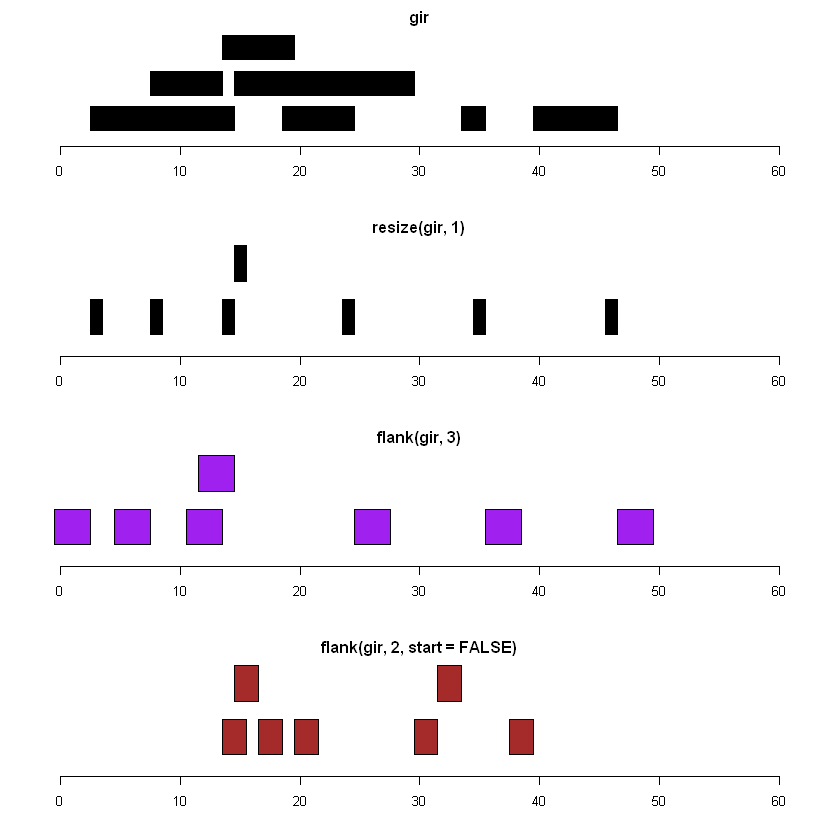

In [52]:
par(mfrow=c(4,1), mar=c(4,2,2,2))
plotRanges(gir, xlim=c(0,60))
plotRanges(resize(gir,1), xlim=c(0,60))
plotRanges(flank(gir,3), xlim=c(0,60), col="purple")
plotRanges(flank(gir,2,start=FALSE), xlim=c(0,60), col="brown")

# 06. Genomic annotation in Bioconductor: Cheat sheet

## Summarizing the key genome annotation resources in Bioconductor
### Executive summary( 내용요약 )

#### Organism-oriented annotation
- sequnce와 gene에 기반한 생물학적인 주석은 세개의 핵심 패키지를 사용함.

- 01. Reference sequence packages: BSgenome.[Organism].[Curator].[BuildID]
- 02. Gene model database packages: TxDb.[Organism].[Curator].[BuildID].[Catalog]
- 03. Annotation map package: org.[Organism2let].[Institution].db

- bracket( [] )표시는 적합한 문자열(token)을 기입해야 함.

- Homo.sapiens, Mus.musculus and Rattus.norvegicus 패키지들은 진화하는 인터페이스를 가진 통합적인 annotation resources가 특화됨.
- 여기에서는 이것의 사용법을 설명함.

####  Systems biology oriented annotation
- GO.db, KEGG.db, KEGGREST, and reactome.db 패키지들은 유전자를 group별로 조직화한 organism-독립적인 resouce 임.
- 그러나, 이 resouce와 gene-oriented annotation간의 맵핑을 하고 있음.

### Names for organisms and their abbreviations
- 표준 린네 분류
- 알아야 할 분류명</br>

- Human = Homo sapiens
- Mouse = Mus musculus
- Rat = Rattus norvegicus
- Yeast = Saccharomyces cerevisiae
- Zebrafish = Danio rerio
- Cow = Bos taurus<br/>

- 축약명
- Human = Hsapiens
- Mouse = Mmusculus
- Rat = Rnorvegicus
- Yeast = Scerevisiae …<br/>

- NCBI-based annotation maps
- Human = Hs
- Mouse = Mm
- Rat = Rn
- Yeast = Sc …<br/>

### Genomic sequence
- These packages have four-component names that specify the reference build used<br/>

- Human = BSgenome.Hsapiens.UCSC.hg19
- Mouse = BSgenome.Mmusculus.UCSC.mm10
- Rat = BSgenome.Rnorvegicus.UCSC.rn5
- Yeast = BSgenome.Scerevisiae.UCSC.sacCer3

### Gene models
- These packages have five-component names that specify the reference build used and the gene catalog<br/>

- Human = TxDb.Hsapiens.UCSC.hg19.knownGene
- Mouse = TxDb.Mmusculus.UCSC.mm10.knownGene
- Rat = TxDb.Rnorvegicus.UCSC.rn5.knownGene
- Yeast = TxDb.Scerevisiae.UCSC.sacCer3.sgdGene

### Annotation maps
- These packages have four component names, with two components fixed. The variable components indicate organism and curating institution.<br/>

- Human = org.Hs.eg.db
- Mouse = org.Mm.eg.db
- Rat = org.Rn.eg.db
- Yeast = org.Sc.sgd.db


# 07.Translating addresses between reference builds with liftOver

- rtracklayer 패키지에는 UCSC genome을 브라우징하기 위해서 개발된 liftOver 유틸리티의 인터페이스가 포함됨.
- 아이디어는 local alignment의 모음을 정의하고, 하나의 reference build 에서 다른 build로 재맵핑할 수 있음.

- hg38에 대한 gene addresses 를 현재 reference build에서 나타낼 수 있으며, hg19의 address와 비교를 위해서 앞의 gene address을 이동시킬 수 있음.

- 예제 데이터 : “ftp://hgdownload.cse.ucsc.edu/goldenPath/hg38/liftOver/hg38ToHg19.over.chain.gz” 

In [ ]:
biocLite("rtracklayer")

library(rtracklayer)
ch = import.chain("D:/Work_R/R-Project/99_ipython/hg38ToHg19.over.chain") 
ch

str(ch[[1]])

In [ ]:
biocLite("TxDb.Hsapiens.UCSC.hg38.knownGene")

In [ ]:
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
tx38 = TxDb.Hsapiens.UCSC.hg38.knownGene
seqlevels(tx38, force=TRUE) = "chr1"
g1_38 = genes(tx38)

In [7]:
g1_19L = liftOver(g1_38, ch)

In [ ]:
g1_19L

# 08. Importing NGS data into Bioconductor 
- R에서 NGS 데이터를 가지고 작업을 위한 2개의 메인 패키지가 있음 : Rsamtools 와 GenomicAlignments 패키지
- Rsamtools : NGS data files에서 정보를 접근하기 위한 기능을 제공함.
- GenomicAlignments : R의 GRanges 객체를 사용해서 Rsamtools 기능을 제공함.

## Rsamtools description  
- Rsamtools package의 설명 : 
- SAM (Sequence Alignment / Map), FASTA, binary variant call (BCF) and compressed indexed tab-delimited (tabix) 파일들을 조작하기 위한 ‘samtools’, ‘bcftools’, and ‘tabix’ 유틸리티의 인터페이스를 제공함.

## What are BAM files? 
- SAM and BAM 파일은 reference reference genome에서 읽어들인 NGS의 정렬 정보를 포함.
- alignment software에서 만들어짐.
- 1) the sequencing machine으로부터 생성된 FASTQ files 
- 2) an genomic index

## How to import NGS data using Rsamtools
- Rsamtools()함수들을 실습하기 위해서 pasillaBamSubset 패키지에 있는 BAM 파일을 사용함.

In [10]:
biocLite("pasillaBamSubset")

BioC_mirror: http://bioconductor.org
Using Bioconductor version 3.1 (BiocInstaller 1.18.4), R version 3.2.2.
Installing package(s) 'pasillaBamSubset'
installing the source package 'pasillaBamSubset'




The downloaded source packages are in
	'C:\Users\braveji\AppData\Local\Temp\RtmpIfPenP\downloaded_packages'


Old packages: 'class', 'curl', 'GenomicRanges', 'MASS', 'nnet', 'S4Vectors',
  'scales', 'spatial', 'class', 'foreign', 'MASS', 'nlme', 'nnet', 'spatial'


In [12]:
biocLite("Rsamtools")

BioC_mirror: http://bioconductor.org
Using Bioconductor version 3.1 (BiocInstaller 1.18.4), R version 3.2.2.
Installing package(s) 'Rsamtools'
Warning message:
: package 'Rsamtools' is in use and will not be installedOld packages: 'class', 'curl', 'GenomicRanges', 'MASS', 'nnet', 'S4Vectors',
  'scales', 'spatial', 'class', 'foreign', 'MASS', 'nlme', 'nnet', 'spatial'


In [ ]:
library(pasillaBamSubset)
library(Rsamtools)
filename <- untreated1_chr4()

- BamFile()함수를 사용해서 BamFile 객체를 생성하고, 이 객체를 사용해서 다른 함수들이 해당 파일에 접근함.

In [ ]:
(bf <- BamFile(filename))

- the BAM file의 헤더에 선언된 chromosomes 정보를 보여줌

In [ ]:
seqinfo(bf)

In [ ]:
(sl <- seqlengths(bf))

- BamFile안의 정렬 종류에 대한 요약

In [ ]:
quickBamFlagSummary(bf)

## Specifying: what and which

- Rsamtools패키지안의 많은 함수들을 ScanBamParam라는 argument 가 필요함.
- scanBamParam는 2가지 중요한 옵션을 갖음.
- 1) what - 어떤 정보를 추출할것인가? 
- 2) which - 정렬의 어느 범위에서 추출할것인가?

- BAM 파일은 자주 인덱스파일과 쌍을 이루어져서 특정 genomic 범위로부터 read 에 대한 정보를 빠르게 읽어올 수 있음.
- chromosome 4에서 레코드( read )의 수를 카운트해 보자.

In [ ]:
(gr <- GRanges("chr4",IRanges(1, sl["chr4"])))

In [ ]:
countBam(bf, param=ScanBamParam(which = gr))

- scanBam()함수로 모든 정보를 볼 수 있음.
- yieldSize라는 argument을 사용해서 새로운 BamFile을 만들어보자.
- yieldSize=5 는 한번에 5개를 압축해제하는 read의 수를 제한함.
- 남는 read가 없을때까지  5개 이상의 read을 갖는 scanBan()함수를 호출함.
- yieldSize라는 argument을 생략하면 한번에 모든 read을 가져옴.
- yieldSize는 2가지 이유로 매우 중요함.
- 1) 한번에 처리할수 있는 read의 수가 제한됨.  PC의 메모리 용량 이내로 처리할 수 있음.
- 2) 디버깅하기 위해서 필요함.

In [8]:
reads <- scanBam(BamFile(filename, yieldSize=5))

## Examining the output of scanBam 

- R에서의 reads 객체는 list의 list 임.
- 바깥쪽 list은 which()함수에서 ranges로 인덱스됨.
- 안쪽 list는  BAM 파일로부터 읽어들인 정보의 다른 조각들이 포함됨.
- what()함수를 사용해서 어떤 종류의 정보들을 볼수 있을지 실습해보자.

In [9]:
class(reads)

[1] "list"

In [10]:
names(reads[[1]])

[1] "qname"  "flag"   "rname"  "strand" "pos"    "qwidth" "mapq"   "cigar" 
 [9] "mrnm"   "mpos"   "isize"  "seq"    "qual"

-  the aligned start position

In [11]:
reads[[1]]$pos

[1] 892 919 924 936 949

- the chromosome

In [12]:
reads[[1]]$rname

[1] chr4 chr4 chr4 chr4 chr4
Levels: chr2L chr2R chr3L chr3R chr4 chrM chrX chrYHet

In [14]:
reads[[1]]$strand

[1] - - + + +
Levels: + - *

- the width of the read

In [15]:
reads[[1]]$qwidth

[1] 75 75 75 75 75

In [ ]:
reads[[1]]$seq

- what() 과 which()를 함께 사용한 예제:

In [ ]:
gr <- GRanges("chr4",IRanges(500000, 700000))
reads <- scanBam(bf, param=ScanBamParam(what=c("pos","strand"), which=gr))

- start 위치의 분포 

In [ ]:
hist(reads[[1]]$pos)

- strand별로 start위치를 나눔

readsByStrand <- split(reads[[1]]$pos, reads[[1]]$strand)
myHist <- function(x) table(cut(x, 50:70 * 10000 ))
tab <- sapply(readsByStrand, myHist)
tab
barplot( t(tab) )

## GenomicAlignments description

- GenomicAlignments 패키지 설명  : 
- 짧은 genomic alignments (reference genome에서 읽어들인 정렬된 짧은 read) 을  정렬하고 조작할 수 있는  효율적인 container를 제공
- read counting, 범위 계산, 접합 검출, 내부의 nucleotide content에 대한 작업이 포함됨.

- GenomicAlignments패키지는 Bioconductor에서는 enomic alignments 표출할 수 있는 클래스와 함수들을 정의함.
- 여기에서 가장 중요한 함수가 2개가 있음.
- 1) readGAlignments - BAM 파일로부터 데이터를 읽어들이는 함수
- 2) summarizeOverlaps - 하나 이상의 파일들로부터 genomic range들 간에 counting reads을 요약함.

- summarizeOverlaps()함수는  read counting page에서 좀 더 깊게 다름.
- summarizeOverlaps()함수는 counting reads에 대해서 GenomicAlignments에 다른 함수와 래핑하는 기능 있음.

- the pasilla dataset안에 있는  BAM파일을 가지고 counting과 readGAlignments함수들의 출력값들을 확인해보자.

In [21]:
library(GenomicAlignments)

In [ ]:
(ga <- readGAlignments(bf))

In [23]:
length(ga)

[1] 204355

- GAlignments objec내부의 GRanges object을 추출

In [ ]:
granges(ga[1])

- 어떤 GenomicRanges함수들을 GAlignments에서 사용할 수 있음.
- findOverlaps, countOverlaps and %over% 는 바로 GAlignments object를 사용함.

In [ ]:
gr <- GRanges("chr4", IRanges(700000, 800000))
(fo <- findOverlaps(ga, gr))

In [26]:
countOverlaps(gr, ga)

[1] 6465

In [ ]:
table(ga %over% gr)

# 09. NGS read counting

- genomic features에 해당하는 NGS reads을 카운트하는 방법을 알아보자.
- 다른 실험 또는 샘플과 대조되는 genomic ranges 과 columns에 상응되는 row들을 갖는 count matrix를 완성해보자.
- pasillaBamSubset 패키지안에 있는 RNA-Seq experiment 데이터를 사용해서 실습함.
- DNA-Seq, ChIP-Seq에서도 같이 사용할 수 있음.

In [ ]:
biocLite("pasillaBamSubset")
biocLite("TxDb.Dmelanogaster.UCSC.dm3.ensGene")

In [ ]:
library(pasillaBamSubset)
library(TxDb.Dmelanogaster.UCSC.dm3.ensGene)

- transcript database object를 읽어옴.
- TxDb.Hsapiens.UCSC.hg19.knownGene은 R에서 생물연구용으로 만들어진 데이터셋
- makeTranscriptDbFromGFF 파일은 GFF or GTF gene models을 인포트할때 사용됨.
- exonsBy()함수는 each gene에 대해서 exon들의 GRangesList object를 가지고 옴.

In [ ]:
txdb <- TxDb.Dmelanogaster.UCSC.dm3.ensGene
grl <- exonsBy(txdb, by="gene")
grl[100]

In [ ]:
grl[[100]][1]

- pasillaBamSubset 패지들안의 함수들은 BAM파일들의 위치를 알아볼 수 있음

In [ ]:
fl1 <- untreated1_chr4()
fl2 <- untreated3_chr4()
fl1

In [35]:
library(Rsamtools)

In [36]:
library(GenomicRanges)
library(GenomicAlignments)

In [37]:
fls <- BamFileList(c(fl1, fl2))
names(fls) <- c("first","second")

- BamFileList()함수를 사용해서 BamFile들을 묶을 수 있음.
- yieldSize argument을 가지고 얼마나 많이 read을 읽을 수 있는지 read counting 함수에 전달할 수 있음.

In [38]:
fls <- BamFileList(c(fl1, fl2))
names(fls) <- c("first","second")

- summarizeOverlaps()함수는 Drosophila(초파리)의 gene이 갖는 특징들을 포함한 BAM 파일들과 overlap을 카운트해 줌.
- strand의 방향성은 무시함.

so1 <- summarizeOverlaps(features=grl,
                         reads=fls,
                         ignore.strand=TRUE)
so1

- assay slot안에 저장된 count matrix

In [ ]:
head(assay(so1))

In [43]:
colSums(assay(so1))

first second 
156469 122872

In [ ]:
rowData(so1)

In [45]:
colData(so1)

DataFrame with 2 rows and 0 columns

In [ ]:
colData(so1)$sample <- c("one","two")
colData(so1)

In [ ]:
metadata(rowData(so1)) 

- 기본적인 탐색적 데이터 분석

In [ ]:
x <- assay(so1)[,1]
hist(x[x > 0], col="grey")

In [ ]:
hist(x[x > 0 & x < 10000], col="grey")

In [ ]:
plot(assay(so1) + 1, log="xy")

# 09. Biological versus technical variability

# Introduction

- genomics data의 분석에서 특별히 중요한 개념을 소개함 => 생물학적 다양성과 기술적인 변이의 구분
- 일반적으로, 군집내에 개별적인 생물학적인 단위에서 발견되어지는 변이는 생물학에서 사용되어지는 용어임.
- 같은 생물학적인 샘플로부터 추출되고, 같은 생물학적인 단위로부터 측정으로부터 관찰에서의 변이는 기술적인 용어임.
- 통계학적 추론을 수행할때 해석에서 상당한 차이기 발생할 수 있으므로, 생물학적 변이과 기술적인 변이을 혼돈되지 않는 것이 중요함.

## Pooling experiment data
- 이번에 사용할 데이터셋은 gene expression arrays로부터 얻은 데이터임.
- 양쪽 strand로부터 랜덤한 12마리의 mice의 RAN을 추출
- 25개의 샘플 모두를 micro arrays에 hybridize시켰으며, 양쪽 strand의 각각 12 마리의 mice의 RNA로부터 2개의 pool을 포함한 pool을 생성시킴.


In [51]:
library(devtools)
install_github("genomicsclass/maPooling")

Installing maPooling
"C:/PROGRA~1/R/R-32~1.2/bin/i386/R" --no-site-file --no-environ --no-save  \
  --no-restore CMD INSTALL  \
  "C:/Users/braveji/AppData/Local/Temp/RtmpimIRCw/devtools14a0425921d/genomicsclass-maPooling-489b3c7"  \
  --library="C:/Users/braveji/Documents/R/win-library/3.2" --install-tests 



- pData()함수를 사용해서 실험디자인을 볼 수 있음.
- 열( row )은 샘플을 나타내고, 행( column )은 mice을 나타냄.
- i, j 셀안의 A1은  sample i 에 포함되어 있는 mouce j로부터 얻은 RNA을 나타냄.

In [ ]:
library(Biobase)
library(maPooling)
data(maPooling)
head(pData(maPooling))

class( pData(maPooling) )

In [ ]:
help (  t )

In [ ]:
a <- matrix(1:30, 5, 6)
a
ta <- t(a)
ta

In [ ]:
par( mfrow=c(1,1))

flipt <- function(m) t(m[nrow(m):1,])

myimage <- function(m,...) {
  image(flipt(m),xaxt="n",yaxt="n",...)
}

myimage(as.matrix(pData(maPooling)),col=c("white","black"),
        xlab="experiments",
        ylab="individuals",
        main="phenoData")

- 궁극적으로 관심있는것은 발현시에 차이가 있는 gene을 찾아내는 것임.

In [65]:
data(maPooling)
pd=pData(maPooling)
pooled=which(rowSums(pd)==12)

In [67]:
names(pooled)

[1] "aq"    "aqtr1" "aqtr2" "aqtr3" "bq"    "bqtr1" "bqtr2" "bqtr3"

In [68]:
grepl("b",names(pooled))

[1] FALSE FALSE FALSE FALSE  TRUE  TRUE  TRUE  TRUE

In [66]:
factor(as.numeric(grepl("b",names(pooled))))

[1] 0 0 0 0 1 1 1 1
Levels: 0 1

- 각각 gene에 대한 group사이에서 평균발현을 비교한다면, 몇개로 구분되어지는 차이를 발견할 수 있음.

In [ ]:
pooled_y=exprs(maPooling[,pooled])
pooled_y

In [ ]:
i=11425;j=11878
pooled_y=exprs(maPooling[,pooled])
pooled_g=factor(as.numeric(grepl("b",names(pooled))))
par( mfrow=c(1,2))
stripchart(split(pooled_y[i,],pooled_g),vertical=TRUE,method="jitter",col=c(1,2),main="Gene 1",xlab="Group",pch=15)
stripchart(split(pooled_y[j,],pooled_g),vertical=TRUE,method="jitter",col=c(1,2),main="Gene 2",xlab="Group",pch=15)

- 이 값들로부터 t-test을 비교하면, 좀더 의미있는 결과을 얻을 수 있음.

In [ ]:
library(genefilter)

In [73]:
pooled_tt=rowttests(pooled_y,pooled_g)
pooled_tt$p.value[i]

[1] 2.075617e-07

In [74]:
pooled_tt$p.value[j]

[1] 3.400476e-07

- Gene1이 더 많은 변이가 있는 gene이고 Gene2는 좀더 안정적임.

- 개별 mice의 microarray data을 가지고 있으며, 각각의 변형에서 12개의 생물학적인 복제본을 갖음.
- 한 개의 rows을 갖는 데이터에서 변형들을 찾아본자.

In [75]:
individuals=which(rowSums(pd)==1)

- 기술적인 복제가 개별 mice에 포함되어 있으므로, 단지 생물적인 복제만을 가지고 분석을 예시를 보여주기 위해서 기술적인 복제를 제거함.

In [76]:
individuals=individuals[-grep("tr",names(individuals))]
y=exprs(maPooling)[,individuals]
g=factor(as.numeric(grepl("b",names(individuals))))

In [ ]:
technicalsd <- rowSds(pooled_y[,pooled_g==0])
biologicalsd <- rowSds(y[,g==0])
LIM=range(c(technicalsd,biologicalsd))
par( mfrow=c(1,1))
boxplot(technicalsd,biologicalsd,names=c("technical","biological"),ylab="standard deviation")

- 생물학적인 분산이 기술적인 분산보다 더 크게 나타냄.
- 분산의 변이가 생물적인 변이에 의한 것임.

In [ ]:
par( mfrow=c(1,2))
stripchart(split(y[i,],g),vertical=TRUE,method="jitter",col=c(1,2),xlab="Gene 1",pch=15)
points(c(1,2),tapply(y[i,],g,mean),pch=4,cex=1.5)
stripchart(split(y[j,],g),vertical=TRUE,method="jitter",col=c(1,2),xlab="Gene 2",pch=15)
points(c(1,2),tapply(y[j,],g,mean),pch=4,cex=1.5)

- p-value은 다른 이야기를 들러줌.

In [79]:
library(genefilter)
tt=rowttests(y,g)
tt$p.value[i]

[1] 0.0898726

In [80]:
tt$p.value[j]

[1] 1.979172e-07

- 2개의 유전자중에서 어떤것이 발현에서 차이를 보여주는 리포티라고 생각하는가 ? 
- 다른 연구자가 다른 랜덤한 mice 샘을 가지고 같은 실험을 했을때, 복제(재현 ???)가 일어날 것은 어떤 것이라고 생각되는가?
- 일반적으로 mice의 변형에 대해서 결론을 짖는다면, 측정되는 생물학적인 변이가 기본적임.

- An analysis with biological replicates have as a population these two strains of mice. 
- An analysis with technical replicates have as a population the twelve mice we selected and the variability is related to the measurement technology. 
- In science we typically are concerned with populations. 
- As a very practical example, not that if another lab performs this experiment they will have another set of twelve mice and thus inference about populations are more likely to replicate.

# 10. Statistical Inference with Bioconductor

## Introduction

- genomics experiments의 context에서 추론에 대해서 다룸.
- pooling experiment data을 읽어드린것부터 시작함.

In [ ]:
library(Biobase)
library(maPooling)
data(maPooling)
pd=pData(maPooling)
individuals=which(rowSums(pd)==1)

- 변형 뿐만아니라 개별 mice에 대해서도 추출함.

In [4]:
individuals=which(rowSums(pd)==1)
individuals=individuals[-grep("tr",names(individuals))]
y=exprs(maPooling)[,individuals]
g=factor(as.numeric(grepl("b",names(individuals))))

## T-test

In [ ]:
library(genefilter)

In [14]:
tt=rowttests(y,g)

In [86]:
sum(tt$p.value<0.01)

[1] 1578

In [87]:
sum(tt$p.value<0.05)

[1] 2908

## Multiple testing

- 모든 gene의 발현정도가 같다라는 귀묵설이 참이라는 가정하고, 첫번째 그룹을 2개로 나누면 어떤 일이 일어나는지 확인해보자. 

In [ ]:
g==0

In [ ]:
sample(c(0,1),sum(g==0),replace=TRUE )

In [ ]:
set.seed(0)
shuffledIndex <- factor(sample(c(0,1),sum(g==0),replace=TRUE ))
nulltt <- rowttests(y[,g==0],shuffledIndex)
sum(nulltt$p.value<0.01)

In [ ]:
sum(nulltt$p.value<0.05)

- p-value가 0.05 이하인 거짓 positives가 840개가 리포팅됨.
- qvalue 패키지안의 qvalue()함수에서 몇가지 조정방법을 제공함.

In [ ]:
biocLite("qvalue")

In [ ]:
library(qvalue)
qvals = qvalue(tt$p.value)$qvalue
sum( qvals < 0.05 )

In [ ]:
sum(qvals<0.01)

- qvalue()함수를 사용하면 거짓 positives을 아주 낮게 생성됨.

In [ ]:
library(qvalue)
nullqvals = qvalue(nulltt$p.value)$qvalue
sum(nullqvals<0.05)

In [ ]:
sum(nullqvals<0.01)

# 11.Using limma for microarray analysis

## First, simple t-tests

- 이번절에는 simple t-test와 limma 계층모델을 가지고 차등 발현(differential expression)을 수행했을때 차이점을 확인해보자.
- Smyth GK, “Linear models and empirical bayes methods for assessing differential expression in microarray experiments”. Stat Appl Genet Mol Biol. 2004 http://www.ncbi.nlm.nih.gov/pubmed/16646809
- limma 분석을 위한 기본적인 과정을 보여주고 있음.
- limma 패키지는 매우 강력하고, 메뉴얼이 수백페이지가 있으며, 해당 메뉴얼을 참조하자.
- 여기서는 일반적으로 사용되는 spike-in 데이터을 읽어들이는 것부터 시작해보자.

In [ ]:
biocLite("SpikeInSubset")

In [ ]:
library(SpikeInSubset)

In [2]:
data(rma95)
fac <- factor(rep(1:2,each=3))
fac

[1] 1 1 1 2 2 2
Levels: 1 2

In [3]:
library(genefilter)

Creating a generic function for 'nchar' from package 'base' in package 'S4Vectors'

Attaching package: 'genefilter'

The following object is masked from 'package:base':

    anyNA



In [4]:
rtt <- rowttests(exprs(rma95),fac)

In [27]:
rtt

,statistic,dm,p.value
1000_at,0.7015293,0.07439513,0.5216415
1001_at,-0.1383839,-0.01663836,0.896624
1002_f_at,-0.7721403,-0.09377082,0.4831178
1003_s_at,-0.4146054,-0.04933055,0.6997015
1004_at,-0.2221063,-0.01655454,0.8351104
1005_at,0.08304612,0.01052663,0.9378047
1006_at,-0.05567284,-0.006221284,0.9582723
1007_s_at,0.06882505,0.005852602,0.9484321
1008_f_at,-0.246125,-0.01977739,0.8176994
1009_at,-0.373673,-0.03861854,0.7276098


- p-value 값이 작고, 평균 절대 차이값(absolute difference)이 크고, feature가 spike-in 값인지 여부에 따라서 색상으로 정의할 수 있음.

In [5]:
mask <- with(rtt, abs(dm) < .2 & p.value < .01)
spike <- rownames(rma95) %in% colnames(pData(rma95))
cols <- ifelse(mask,"red",ifelse(spike,"dodgerblue","black"))

- 두번째 그룹과 첫번째 그룹의 차이에 관심이기 때문에 dm에 -1을 곱함.
- p-value가 작고, 평균 절대 차이값이 높은 spike-in gene은 blue로 표시
- p-value가 작고, 평균 절대 차이값이 작은 indicate gene을 red로 표시
- limma를 사용한 후에 점들이 어떻게 변화는지 확인해보자.

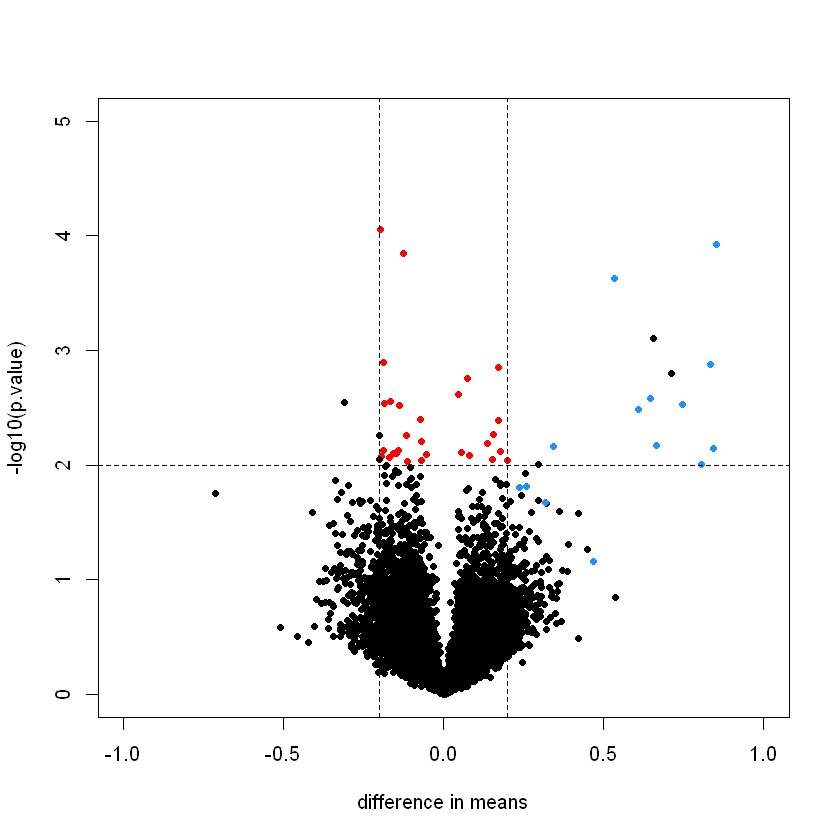

In [6]:
with(rtt, plot(-dm, -log10(p.value), cex=.8, pch=16,
     xlim=c(-1,1), ylim=c(0,5),
     xlab="difference in means",
     col=cols))
abline(h=2,v=c(-.2,.2), lty=2)

- red genes이 표준편차가 거의 낮게 나오는것을 주목하자.

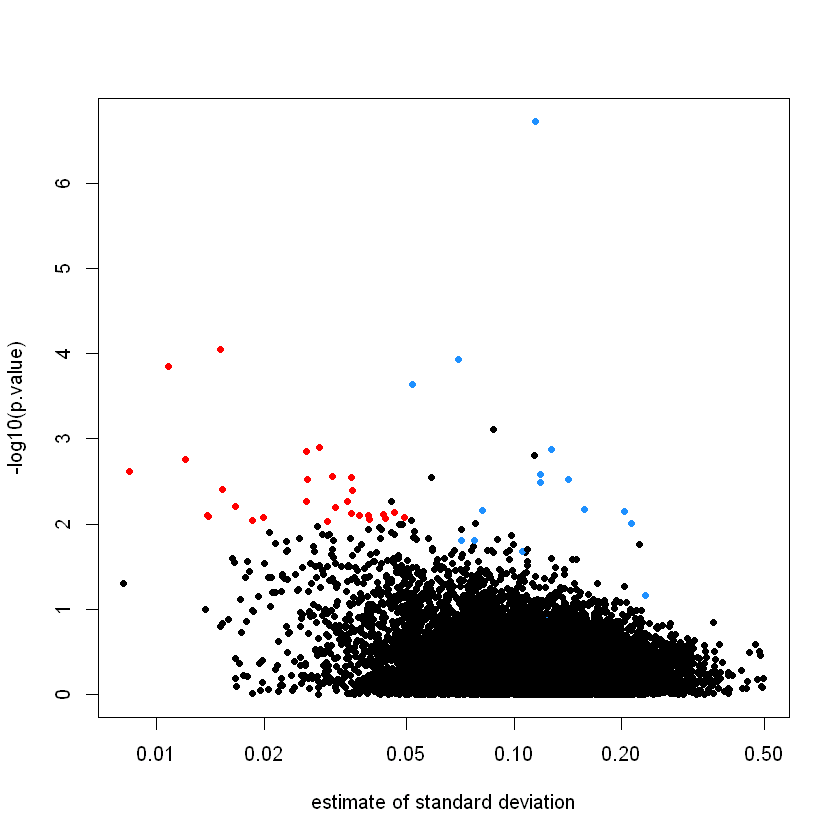

In [7]:
rtt$s <- apply(exprs(rma95), 1, function(row) sqrt(.5 * (var(row[1:3]) + var(row[4:6]))))
    
with(rtt, plot(s, -log10(p.value), cex=.8, pch=16,
              log="x",xlab="estimate of standard deviation",
              col=cols))

## limma steps

- limma 분석을 3가지 과정을 수행함.
- 절편보다는 group간의 차이에 관심이 있기 때문에 coef=2로 설정함.

In [8]:
biocLite("limma")

ERROR: Error in eval(expr, envir, enclos): 함수 "biocLite"를 찾을 수 없습니다


In [5]:
library(limma)

In [10]:
fit <- lmFit(rma95, design=model.matrix(~ fac))
colnames(coef(fit))

[1] "(Intercept)" "fac2"

In [11]:
fit <- eBayes(fit)
tt <- topTable(fit, coef=2)
tt

,logFC,AveExpr,t,P.Value,adj.P.Val,B
1708_at,-7.061061,7.945276,-73.52927,7.81637e-17,9.868948e-13,8.646866
36202_at,0.8525527,9.373033,9.975114,4.935683e-07,0.003115897,4.587736
36311_at,0.8318298,8.564315,8.363252,3.017008e-06,0.01269758,3.56779
33264_at,0.7118997,4.918953,7.434888,9.666328e-06,0.02706595,2.835849
32660_at,0.6554022,8.680132,7.35618,1.071834e-05,0.02706595,2.768151
38734_at,0.7467142,6.255772,7.185131,1.345115e-05,0.02830571,2.617789
1024_at,0.842655,9.697281,6.730664,2.503461e-05,0.04400123,2.195944
36085_at,0.6449402,12.19313,6.65383,2.787976e-05,0.04400123,2.121308
33818_at,0.5321749,12.28564,6.454504,3.69948e-05,0.0518996,1.923063
39058_at,0.6090625,7.534532,6.278815,4.767986e-05,0.05687699,1.742696


- topTable()함수는 어떤 정의한 값에 의해서 순위를 결정하고, top gene을 반환함.
- "none" 으로 정렬되면, 모든 값들을 반환함.
- 자동적으로 column은 각각의 gene에 대해서 adjusted p-values을 포함함.
- Benjamini-Hochberg의 method을 디폴트로 사용해서 p.adjust()함수가 호출됨.

In [12]:
dim(topTable(fit, coef=2, number=Inf, sort.by="none"))

[1] 12626     6

- limma 결과을 가지고 이전의 volcano plot과 비교하자.
- red 점들은 -log10(p.value) 값이 2보다 아래에 모두 있음.
- 실제적인 차이값을 갖는 blue 점들은 이전보다 훨씬 높은 값은 p-value을 갖음.

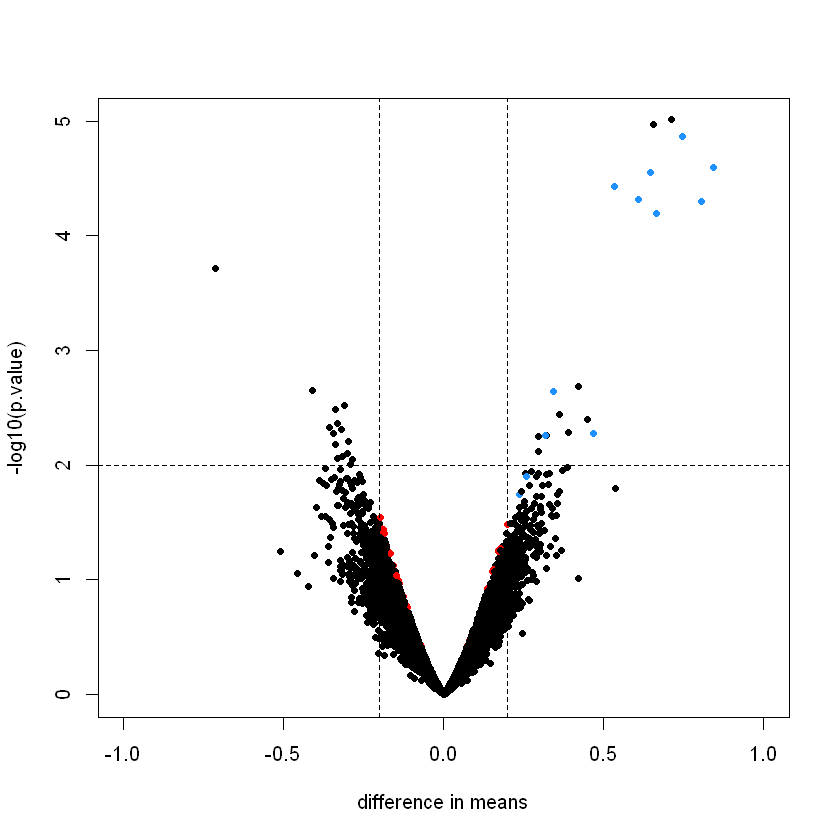

In [13]:
limmares <- data.frame(dm=coef(fit)[,"fac2"], p.value=fit$p.value[,"fac2"])

with(limmares, plot(dm, -log10(p.value),cex=.8, pch=16,
     col=cols,xlab="difference in means",
     xlim=c(-1,1), ylim=c(0,5)))

abline(h=2,v=c(-.2,.2), lty=2)

- limma가 분산의 너무 낮은 추정치에서 발생할 수 있는 오탐 (false positive)을 줄이는 방식으로 일반적인 값에 가깝도록 분산추정( variance estimates )을 어떻게 축소시키는지 그림으로 보여줌.


- 다른 분산 추정값을 갖는 40개의 상자( bin )에서 그 상자안에 gene이 없으면 제거함.

In [ ]:
n <- 40
qs <- seq(from=0,to=.2,length=n)
qs
help( cut )
cut(rtt$s^2,qs)

In [18]:
Z <- stats::rnorm(1000)
table(cut(Z, breaks = -6:6))


(-6,-5] (-5,-4] (-4,-3] (-3,-2] (-2,-1]  (-1,0]   (0,1]   (1,2]   (2,3]   (3,4] 
      0       0       1      24     144     318     360     133      19       1 
  (4,5]   (5,6] 
      0       0 

In [ ]:
n <- 40
qs <- seq(from=0,to=.2,length=n)
idx <- sapply(seq_len(n),function(i) which(as.integer(cut(rtt$s^2,qs)) == i)[1])
idx <- idx[!is.na(idx)]
idx

- genes에 대한 초기 분산 추정값과 limma를 실행한 후에 gene의 분산 추정값을 잇는 그림임.

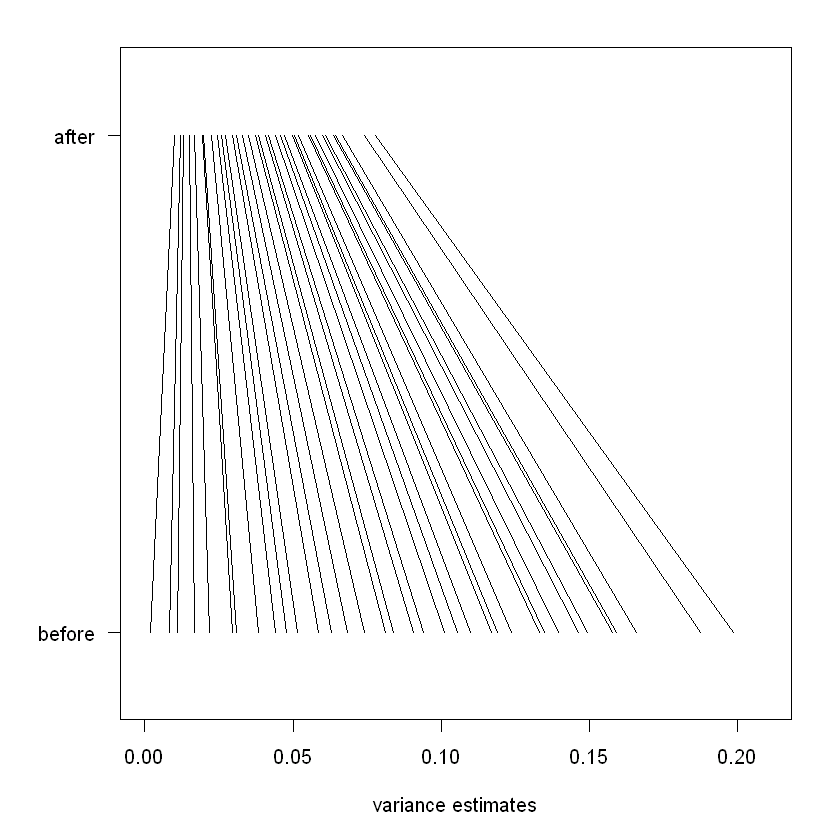

In [41]:
par(mar=c(5,5,2,2))
plot(1,1,xlim=c(0,.21),ylim=c(0,1),type="n",
     xlab="variance estimates",ylab="",yaxt="n")
axis(2,at=c(.1,.9),c("before","after"),las=2)
segments((rtt$s^2)[idx],rep(.1,n),
         fit$s2.post[idx],rep(.9,n))

# 12. Gene set analysis

- gene set 분석에 필요한 통계을 알아보자.
- 3가지 중요한 과정
- 1) 고려되어야 할 gene sets
- 2) 각각의 gene set을 요약하는 통계값
- 3) 불확실성을 평가하는 방법

## Preparing data and gene set database

In [ ]:
source("http://www.bioconductor.org/biocLite.R")
biocLite("GSEABase")

In [ ]:
library(rafalib)
library(GSEABase)

In [ ]:
library(devtools)
install_github("genomicsclass/GSE5859Subset")

In [ ]:
biocLite("sva")

- sva 설명 문서 :  http://www.bioconductor.org/packages/release/bioc/vignettes/sva/inst/doc/sva.pdf
- sva function to estimate batch and other artifacts 

In [ ]:
help( sva )

In [ ]:
library(GSE5859Subset)
data(GSE5859Subset)
library(sva)
library(limma)
X = sampleInfo$group
X
mod<-model.matrix(~X)
mod
svafit <- sva(geneExpression,mod)
svafit

In [ ]:
help ( pt )

In [ ]:
svaX<-model.matrix(~X+svafit$sv)
lmfit <- lmFit(geneExpression,svaX)
summary( lmfit )
tt<-lmfit$coef[,2]*sqrt(lmfit$df.residual)/(2*lmfit$sigma)
pval <- 2*(1-pt(abs(tt),lmfit$df.residual[1]))
qval <- p.adjust(pval,"BH")

qval[ qval <= 0.25  ]

- 각각의 gene의 score 와  차별적으로 발현되는 gene의 후보 목록을 구하는것은 꼭 필요함.
- 25%의 FDR값을 갖는 후보유전자 리스트 만들어 보자.
- 23개의 gene 리스트 얻을 수 있음.
- 이것으로 부터 알 수 있는것은 무엇인가?? => gene들이 함께 동작한다는 것을 앎으로 해서, 개별 유전자 대신에 유전자 그룹을 연구해야 한다는 것을 의미함.
- 이것이 gene set 분석의 기본 개념임.

=============================================================================================================
- gene sets 를 제공하는 웹사이트에 다양한 resource들이 있음.
- 이 데이터의 대부분은 잘 설계( curated )되어 있으며, 일반적인 기능을 갖는 gene으로 구성됨.
- 그것들을 그룹핑하는 방법은 생화학적인 pathway(KEGG) 또는 생물학적인 기능(Gene Ontology)으로 나누어짐.
- http://www.broadinstitute.org/gsea/msigdb/index.jsp 사이트에서 chromosome 부위별 gene을 그룹핑한 gene set을 사용할 것임.
- http://www.broadinstitute.org/gsea/msigdb/download_file.jsp?filePath=/resources/msigdb/4.0/c1.all.v4.0.entrez.gmt 
- 이 데이터베이스를 다운로드 받아야 함. ( 가입 필요 )
- https://github.com/genomicsclass/labs/blob/master/course4/c1.all.v4.0.entrez.gmt 에서 받으면 됨.

In [9]:
gsets <- getGmt("D:/Work_R/R-Project/99_ipython/c1.all.v4.0.entrez.gmt.txt")
length(gsets)

[1] 326

In [21]:
head(names(gsets))

[1] "chr5q23"  "chr16q24" "chr8q24"  "chr13q11" "chr7p21"  "chr10q23"

In [11]:
gsets[["chryq11"]]

setName: chryq11 
geneIds: 728512, 392597, ..., 360027 (total: 204)
geneIdType: Null
collectionType: Null 
details: use 'details(object)'

- ENTREZ ids 을 알아보기

In [10]:
head(geneIds(gsets[["chryq11"]]))

[1] "728512" "392597" "9086"   "359796" "83864"  "425057"

- 이 IDS을 Affymetrix IDs로 맵핑 필요함.
- Expression Set에 적용할 간단한 함수를 작성함

In [ ]:
biocLite("hgfocus.db")
library(hgfocus.db)

mapGMT2Affy <- function(object,gsets){
  ann<-annotation(object)
  dbname<-paste(ann,"db",sep=".")
  require(dbname,character.only=TRUE)
  gns<-featureNames(object)


  map<-select(get(dbname), keys=gns,columns=c("ENTREZID", "PROBEID"))
  map<-split(map[,1],map[,2])
  indexes<-sapply(gsets,function(ids){
    gns2<-unlist(map[geneIds(ids)])
    match(gns2,gns)
    })
  names(indexes)<-names(gsets)
  return(indexes)
}

rownames(sampleInfo)<- colnames(geneExpression)
e=ExpressionSet(assay=geneExpression,
                phenoData=AnnotatedDataFrame(sampleInfo),
                annotation="hgfocus")

gsids <- mapGMT2Affy(e,gsets) 
gsids 

## Approaches based on association tests ( 연관테스트를 기반한 접근방법 )

- 차등 발현 유전자들이 주어진 gene set에 풍부히 있다라고 의문을 가질 수 있으며, 어떻게 확인할 수 있겠는가 ??
- 가장 간단한 접근방법은 이전 장에서 배운 독립성 검증을 위한 chi-square test 를 적용하는 것임.
- Y chromosome gene sets에 대해서 적용해보자. 

In [ ]:
tab <- table(ingenset=1:nrow(e) %in% gsids[["chryq11"]],signif=qval<0.05)
chisq.test(tab)$p.val

- 남자와 여자를 비교하는 것이기 때문에 Y chromosome 있는 gene들이 차등발현이 풍부하다는것은 놀라운 일이 아님.
- 이 방법은 생물학적으로 흥미로운 gene set을 찾는 방법은 아님.

In [ ]:
library(rafalib)
par( mfrow=c(1,1))
qs<-seq(0,1,len=length(tt)+1)-1/(2*length(tt));qs<-qs[-1]
qqplot(qt(qs,lmfit$df.resid),tt,ylim=c(-10,10),xlab="Theoretical quantiles",ylab="Observed") 
abline(0,1)

## Gene set summary statistics

- 현재의 대부분의 gene sets 분석 실험방법으로는 차등과 비차등 발현으로 유전자를 나눌 수 없음.
- 대신에, t-test와 같은 통계적인 방법을 사용함.
- 어떤 유전자가 X chromosome 불활성화에서 벗어났는지를 알아보기 위해서,  X chromosome의 첫번째 그룹에 대해서 t-통계량의 분포를 알아보자.

ind <- gsids[["chrxp11"]]
ind
par( mfrow=c(1,1))
plot(density(tt[-ind]),xlim=c(-7,7),main="",xlab="t-stat",sub="",lwd=4)
lines(density(tt[ind],bw=.7),col=2,lty=2,lwd=4)
rug(tt[ind],col=2)

- gene set의 t-분포가 모든 gene의 분포가 다르다는 증거로 gene set의 분포는 약간 왼쪽으로 이동되어 있음.

================================================================
- 관찰값의 정량화를 어떻게 하는지와 불확실성을 어떻게 측정하는지 알아보자.
- 첫번째로 이전 절에서 논의한 Wilcox Mann-Whitney tests을 사용해서 2001년에 Virtaneva라는 사람이 gene set analysis을 수행하는 방법을 발표함.
- 기본적인 아이디어는 case와 control이 차이가 일반적으로 크다면, 주어진 gene set과 나머지 gene을 비교하는 테스트를 하는 것임.

- 각각의 gene set에 대해서 Wilcoxon test(http://blog.naver.com/PostView.nhn?blogId=mystery777&logNo=220225120624)을 수행함.
- Wilcoxon 통계량을 평균 0, 표준편차가 1이 되도록 표준화함.
- 중심극한 정리에 의해서 gene sets 충분히 크고, 각각의 gene에 대한 효과의 크기가 충분하다면, 이것들의 통계량은 정규분포를 따르고 독립적임.

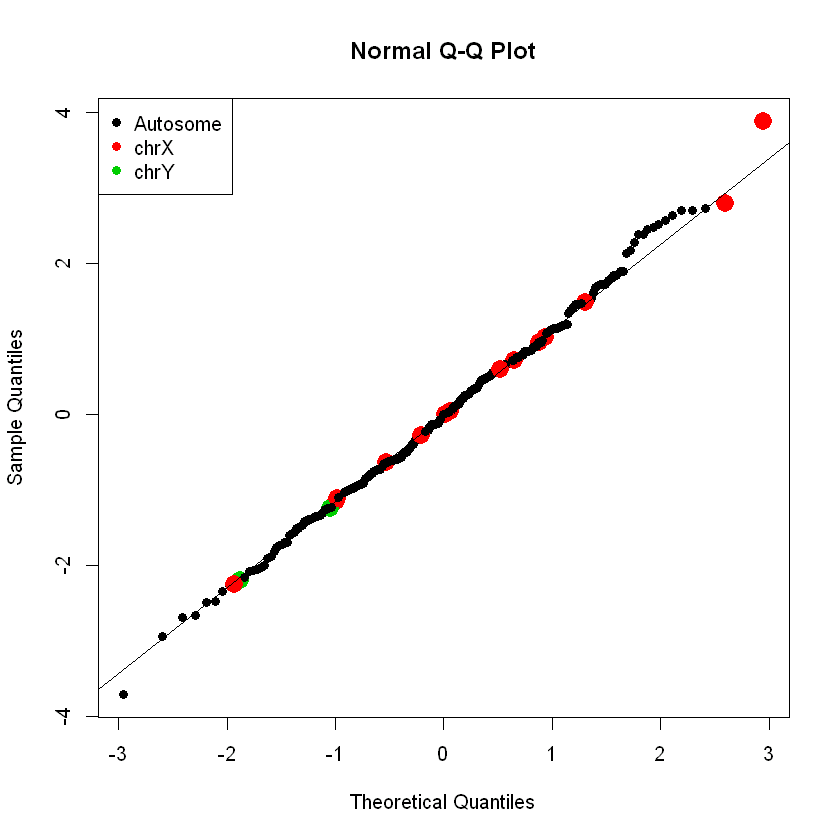

In [19]:
es <- lmfit$coef[,2]
wilcox <- t(sapply(gsids,function(i){
  if(length(i)>2){
  tmp<- wilcox.test(es[i],es[-i])  
  n1<-length(i);n2<-length(es)-n1
  z <- (tmp$stat -n1*n2/2) / sqrt(n1*n2*(n1+n2+1)/12)
  return(c(z,tmp$p.value))
  } else return(rep(NA,2))  
  }))
par( mfrow=c(1,1))
cols <- rep(1,nrow(wilcox))
cols[grep("chrx",rownames(wilcox))]<-2
cols[grep("chry",rownames(wilcox))]<-3
qqnorm(wilcox[,1],col=cols,cex=ifelse(cols==1,1,2),pch=16)
qqline(wilcox[,1])
legend("topleft",c("Autosome","chrX","chrY"),pch=16,col=1:3,box.lwd=0)

- 상위 10개는 X and Y chromosomes이 기대한 것과 같이 많은 발현을 보여주고 있지 않음.
- rank based (robust) test 방법은 하나 또는 2개가 매우 발현이 많은 gene들이 gene set 분석의 결과에 많은 영향을 주지 않음.
- 그러나, 비록 low rank based tests는 매우 활용도가 좋지만, false positive을 알려줌.
- 아래에서는,  다소 약한 robust 이지만,  일반적으로 강력한 방법은 고려해보자.

==========================================================================================
- 만약, 위의 가장 간단한 테스트에서와 같이 왼쪽(발현량이 낮은 genes) 또는 오른쪽( 발현량이 많은 genes )으로 shift된 분포을 가지고 gene set을 관심을 갖는다면,  두 그룹사이에서 평균을 단순 비교할 수 있음.
- 평균이 shift된지를 판단하는 매우 단순한 요약은 gene set에서 t-통계량을 평균을 구하는 것임.
- http://www.ncbi.nlm.nih.gov/pubmed/?term=20048385.
- gene sets에서  gene들의 인덱스를 G표시하고,  t-통계량의 평균을 구하는 공식을 정의하면,
![modPlot](04_01.jpg "modPlot")

- gene set에서 gene들이 발현이 다르지 않다라는 귀무가설은 t의 평균이 0 임
- 만약, t-통계량이 각각의 gene들에서 독립적이라면,  t의 평균은 표준편차가 1 이고  대략적으로 정규분포를 따름.
![modPlot](04_02.jpg "modPlot")
- qq-plot을 그려서 확인해봄.

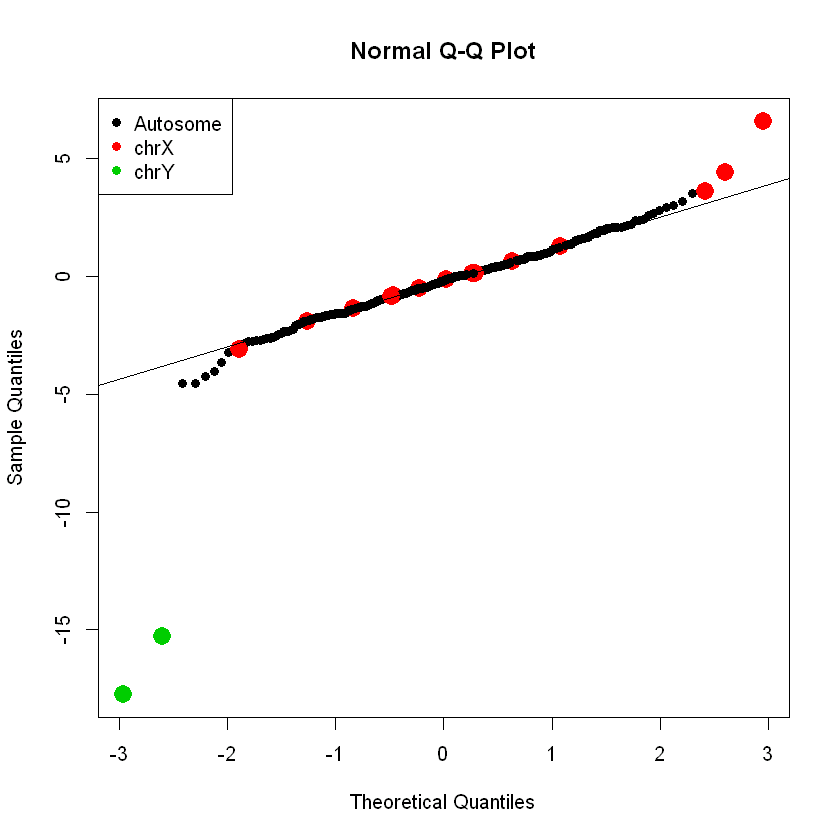

In [20]:
avgt <- sapply(gsids,function(i) sqrt(length(i))*mean(tt[i]))
qqnorm(avgt,col=cols,cex=ifelse(cols==1,1,2),pch=16)
qqline(avgt)
legend("topleft",c("Autosome","chrX","chrY"),pch=16,col=1:3,box.lwd=0)

## Hypothesis testing for gene sets
- t-통계량들이 독립적이고 동일한 분포에 대해서는 정규 근사됨.

![modPlot](04_03.jpg "modPlot")

- 독립이라는 가정이지만, 그렇지 않는 상황에서도 gene set이 상관관계를 나타날 수 있다고 기대할 수 있음.
- 이를 보여주기 위해서, 각각의 gene set에서 모든 pairwise correlations의 평균을 구하고, 그것들이 항상 0 이 아니라고 보여줌

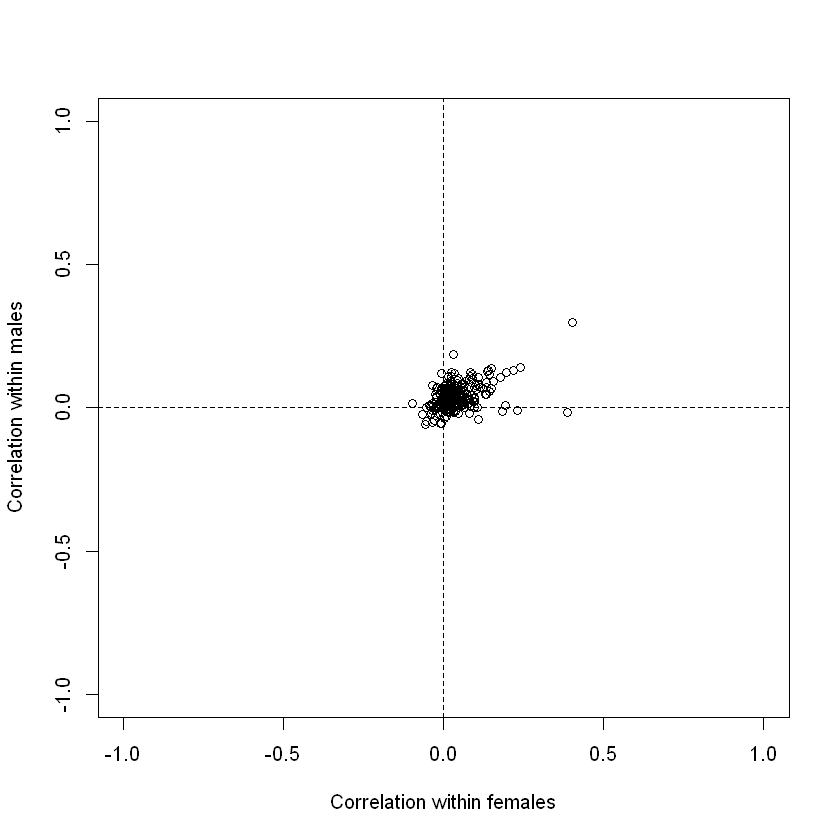

In [21]:
N <- sapply(gsids,length)
ind1<-which(X==0)
ind2<-which(X==1)
corrs <- t(sapply(gsids,function(ind){
  if(length(ind)>=2){
    cc1<-cor(t(geneExpression[ind,ind1]))
    cc2<-cor(t(geneExpression[ind,ind2]))
  return(c(median(cc1[lower.tri(cc1)]),
    median(cc2[lower.tri(cc2)])))
  } else return(c(NA,NA))
}))
par( mfrow=c(1,1))
plot(corrs[N>10,],xlim=c(-1,1),ylim=c(-1,1),xlab="Correlation within females",ylab="Correlation within males")
abline(h=0,v=0,lty=2)

- gene set안의 gene간에는 상관관계( ρ )를 갖는 경우에는 아래와 같은 수식으로 t-통계량 평균을 구할 수 있음.
![modPlot](04_05.jpg "modPlot")

![modPlot](04_04.jpg "modPlot")

- 상관계수(ρ)가 양수이면, {1+(N−1)ρ} 만큼 분산이  늘어나게 됨. 
- gene set안에서 모두 ρ값이 같다라고 기대할 수 없지만, 보정계수( correction factor )은 각각의 gene set 에 대해서  average ρ를 의존해서 구할 수 있음.  http://dx.doi.org/10.1214/07-AOAS146 의 page 295에 수식이 있음.
- 보정계수는 위에서 언급한것 같이 간단한 요약 통계량에 적용할때 사용될 수 있음.
- simple mean shift 접근법을 기반한 몇몇 방법들이 발표되어 있지만, 
- 실제적으로는 점근 근사 기반(ROAST, CAMERA)으로 요약 통계 및 통계 추론을 개발하기 위해서 상관관계을 계산함.
- 간단하게 여기서는 sqrt(N) * t 을 기반한 근사값과 보정계수를 사용하고, 비교해 봄.
![modPlot](04_06.jpg "modPlot")
 

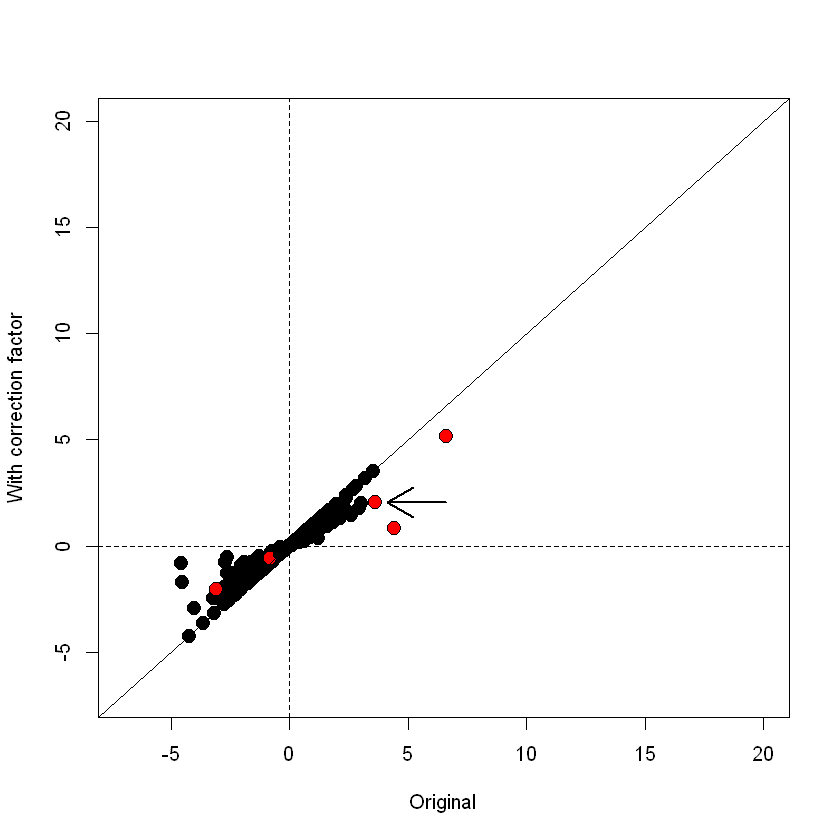

In [22]:
avgcorrs <- rowMeans(corrs)
cf <- (1+(N-1)*avgcorrs)
cf[cf<1] <- 1 ## we ignore negative correlations
correctedavgt <- avgt/sqrt(cf)
parampvaliid <- 2*pnorm(-abs(avgt))
parampval<- 2*pnorm(-abs(correctedavgt))
plot(avgt,correctedavgt,bg=cols,pch=21,xlab="Original",ylab="With correction factor",xlim=c(-7,20),ylim=c(-7,20),cex=1.5)
abline(0,1)
abline(h=0,v=0,lty=2)
thirdhighest <- order(-avgt)[3]
arrows(avgt[thirdhighest]+3,correctedavgt[thirdhighest],x1=avgt[thirdhighest]+0.5,lwd=2)

- 표시된 gene set이 보정계수를 크게 되도록, 상대적으로 높은 상관계수와 크기를 갖음.

- 요약  : 
- t-통계량의 평균은  gene set에서의 요약통계량의 간단 예제로 사용하였음.
- gene set안에 있는 gene이 독립적이지 않을때는 보정계수가 필요하다는것을 보였음.
- 간단하게 분석을 위해서는 t-통계량의 평균을 사용하고, testing-for-mean-shifts 방법(SAFE, ROAST, CAMERA)으로 개발된  좀더 엄밀한 방법을 사용할 수도 있음
- inflation factor로  t-통계량의 평균을 조정한 후에는 null distribution가 성립되지 않을 수 있음.
- 예를 들면, 샘플의 크기와 gene set의 크기가 너무 작을 때임.

- 다음절에는 parametric  가정이 없이 null distribution을 검증하는 permutations을 어떻게 사용하는지 설명함. 

## Permutations

- 충분한 샘플크기와 parametric tests로 대체가 가능하면  관심있는 결과를 나오게 하기 위해서 gene set specific permutation test을 수행함.
- permutation test의 설명 : http://blog.naver.com/ojonghyeon/100037651218   ,  https://en.wikipedia.org/wiki/Resampling_(statistics)#Permutation_tests
- 이 접근방법은 http://www.ncbi.nlm.nih.gov/pubmed/16199517  와 같은 여러가지 방법들이 구현됨.
- 좋은 결과를 나오게 하기 위해서, 순열( permutations )을 사용해서 귀무가설하에서의 여러 가지 분포(null distributions)를 만들어냄.
- 여기서는 간단한 t-통계량의 평균에 대한 permutation test을 수행함.

In [25]:
install.packages("matrixStats",  repos="http://cran.fhcrc.org" )

Installing package into 'C:/Users/braveji/Documents/R/win-library/3.2'
(as 'lib' is unspecified)


package 'matrixStats' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\braveji\AppData\Local\Temp\Rtmpy8hxeb\downloaded_packages


In [27]:
library(matrixStats)
set.seed(1)
B <- 400 
null <- sapply(1:B,function(b){
 nullX<- sample(X)
 nullsvaX<-model.matrix(~nullX+svafit$sv) 
 nulllmfit <- lmFit(geneExpression,nullsvaX)
 nulltt<-nulllmfit$coef[,2]*sqrt(nulllmfit$df.residual)/(2*nulllmfit$sigma)
 nullavgt <- sapply(gsids,function(i) sqrt(length(i))*mean(nulltt[i]))
 return(nullavgt)
})
permavgt <- avgt/rowSds(null)
permpval<- rowMeans(abs(avgt) < abs(null))
permavgt
permpval

chr5q23      chr16q24       chr8q24      chr13q11       chr7p21 
 -0.258577544   0.115238181  -1.079909636  -1.398351046  -0.730795304 
     chr10q23      chr13q13      chr10q21       chr1p13       chrxp21 
  1.896836097  -1.782522422   0.048921830   1.158967782  -0.528132882 
      chr4q12       chr6q13       chr2p22      chr18q23       chr8p11 
  0.465758049  -0.606006673   2.179129839  -1.501764466  -0.972355644 
      chr1p11       chr9p12      chr20p12       chr7p13       chr4p16 
  0.703538798   0.026092965   1.931422940  -1.112302304  -1.608922916 
      chr8q22      chr14q11       chryp11      chr10q25        chr11q 
 -1.217150839  -0.004897984 -11.227779905  -1.973860992  -1.189187790 
      chr4p14      chr15q26      chr12q15       chr4p12       chr9q12 
 -0.244794118  -1.245940837   0.067314986   0.059567817   0.229592417 
      chr2q22       chr9q33        chr18p       chr3q28      chr12q14 
 -0.437339448   1.670693560   0.301675394   0.490722749   1.624741291 
      chr2q36       chr9q22       chr3p22         chrxq       chr6p11 
 -2.630697849  -0.316272608  -0.105733423  -0.791432898  -0.199451653 
     chr12q24       chr2q32       chr4q35       chr3p14        chr22q 
 -1.084253147   0.586966077  -2.126727403   2.575143508   1.714859286 
     chr15q24         chr2p      chr13q31      chr19p13      chr12q22 
 -2.048148187   1.650499742   0.804912212  -1.371152225   0.016574110 
        chr7p      chr11q22       chrxq28      chr16q22      chr11q24 
  1.762789123   0.097692277  -1.499510057  -0.660910881  -1.254319114 
      chr5q12      chr10p11       chr5q21      chr14q21       chrxq12 
  1.398961102  -0.672753374   0.059323591   0.431480898   0.108704623 
      chr1p35       chr3p12       chr4q21      chr10p15      chr18q21 
 -0.566838840   1.044258636   0.092431768   1.068869191   0.675277708 
      chr1p33      chr11q12      chr17q22       chr1p31      chr10p13 
 -1.475212259  -2.186354983  -0.567364031   0.730088958  -2.179818317 
     chr14q13       chr2q24      chr22q13      chr15q11       chr1q43 
 -0.906004852   1.433085114  -1.103687794  -0.237280371   0.314499379 
       chr19p       chr3q24      chr22q11       chr7p11      chr16q13 
  0.987604547  -0.195921212   0.450298104  -0.737863617  -0.562339654 
      chr1p22        chr12p       chr2q11       chr9p21       chr4q33 
  1.868007200  -0.472308788   0.750133402   1.064050583   0.682282824 
      chr2p11       chr2q34      chr17q23      chr14q23       chr5q33 
  0.781303201  -0.713873373  -0.409379049  -0.425691394   0.618974800 
      chr6q27       chr3q26      chr10q11       chr5p12       chr1q21 
 -0.865833265  -1.746466539   0.624821578  -0.741149334   0.103050691 
      chr4q24       chr7q31       chr6p21        chr17q       chr5q15 
 -2.802538539   1.127747382  -0.047301805  -1.087774356   1.872522871 
      chr2q13       chr1q23       chr6q23      chr11q14       chr5p14 
  1.571253005   0.862133345   1.851523365   0.010162435   0.322216796 
      chr5q31       chr2p24       chr9p11       chr4q26       chr1q25 
 -0.773682115   0.224806887  -0.144074012   1.010254044   0.706389861 
      chrxq11       chr5q14       chr4q28       chr1q42       chr6p25 
  0.633909184   0.063854427  -1.815246221  -0.171213813   1.039486517 
     chr13q34       chr8q12       chr4q22       chr7q22       chr6p23 
 -0.010779379  -0.333420994  -1.781172412  -0.877200402   0.411387916 
      chr8p21       chr5q35      chr13q32      chr12q12       chr3p24 
  0.031220842   0.032364500   0.552281134  -1.713072883   0.025706575 
      chr7q33      chr12p12       chr9p23       chr7p14       chr6q21 
  1.040544576   0.042130622   0.396708398   0.461845487   0.774753896 
      chryq11      chr15q13       chr3q22       chr6q15       chr4q31 
 -6.102349343   1.195733412   0.373140237   0.178072104   0.866704625 
      chr3q12      chr13q22      chr15q15       chr3p26      chr17q12 
  2.468653764  -1.091693962   0.161519506  -0.370279537   1.813827430 
     chr11p12       chr7p12   

chr5q23 chr16q24  chr8q24 chr13q11  chr7p21 chr10q23 chr13q13 chr10q21 
  0.8000   0.9000   0.3075   0.1775   0.4775   0.0475   0.0850   0.9525 
 chr1p13  chrxp21  chr4q12  chr6q13  chr2p22 chr18q23  chr8p11  chr1p11 
  0.2475   0.6025   0.6400   0.5250   0.0275   0.1300   0.3075   0.4700 
 chr9p12 chr20p12  chr7p13  chr4p16  chr8q22 chr14q11  chryp11 chr10q25 
  0.9750   0.0550   0.2950   0.0900   0.2175   0.9950   0.0000   0.0625 
  chr11q  chr4p14 chr15q26 chr12q15  chr4p12  chr9q12  chr2q22  chr9q33 
  0.2400   0.8350   0.2225   0.9575   0.9575   0.8125   0.6600   0.1050 
  chr18p  chr3q28 chr12q14  chr2q36  chr9q22  chr3p22    chrxq  chr6p11 
  0.7325   0.6175   0.1200   0.0075   0.7950   0.9050   0.4325   0.8625 
chr12q24  chr2q32  chr4q35  chr3p14   chr22q chr15q24    chr2p chr13q31 
  0.2875   0.5525   0.0300   0.0100   0.1000   0.0425   0.0975   0.4300 
chr19p13 chr12q22    chr7p chr11q22  chrxq28 chr16q22 chr11q24  chr5q12 
  0.1850   0.9925   0.0575   0.9425   0.1375   0.5150   0.2125   0.1650 
chr10p11  chr5q21 chr14q21  chrxq12  chr1p35  chr3p12  chr4q21 chr10p15 
  0.5050   0.9525   0.6550   0.9300   0.5800   0.3100   0.9450   0.3025 
chr18q21  chr1p33 chr11q12 chr17q22  chr1p31 chr10p13 chr14q13  chr2q24 
  0.5225   0.1550   0.0325   0.5875   0.4475   0.0200   0.3850   0.1625 
chr22q13 chr15q11  chr1q43   chr19p  chr3q24 chr22q11  chr7p11 chr16q13 
  0.2650   0.7875   0.7425   0.3150   0.8650   0.6575   0.4725   0.5800 
 chr1p22   chr12p  chr2q11  chr9p21  chr4q33  chr2p11  chr2q34 chr17q23 
  0.0700   0.6325   0.4275   0.3150   0.5050   0.4550   0.4725   0.6975 
chr14q23  chr5q33  chr6q27  chr3q26 chr10q11  chr5p12  chr1q21  chr4q24 
  0.6750   0.5250   0.3925   0.0850   0.5700   0.4625   0.9300   0.0025 
 chr7q31  chr6p21   chr17q  chr5q15  chr2q13  chr1q23  chr6q23 chr11q14 
  0.2925   0.9750   0.3000   0.0525   0.1275   0.3950   0.0600   0.9875 
 chr5p14  chr5q31  chr2p24  chr9p11  chr4q26  chr1q25  chrxq11  chr5q14 
  0.7275   0.4525   0.8225   0.8675   0.3150   0.4675   0.5275   0.9300 
 chr4q28  chr1q42  chr6p25 chr13q34  chr8q12  chr4q22  chr7q22  chr6p23 
  0.0575   0.8400   0.3100   0.9950   0.7400   0.0600   0.3825   0.6850 
 chr8p21  chr5q35 chr13q32 chr12q12  chr3p24  chr7q33 chr12p12  chr9p23 
  0.9775   0.9675   0.5475   0.0900   0.9800   0.3000   0.9850   0.6675 
 chr7p14  chr6q21  chryq11 chr15q13  chr3q22  chr6q15  chr4q31  chr3q12 
  0.6925   0.4300   0.0000   0.2200   0.6775   0.8550   0.3825   0.0100 
chr13q22 chr15q15  chr3p26 chr17q12 chr11p12  chr7p12    chr6q  chrxq21 
  0.2725   0.8900   0.7250   0.0675   0.0875   0.3175   0.3550   0.2225 
chr19q13 chr16p12  chr1q32  chr8p23  chrxq23  chr2p15 chr18q12 chr17p13 
  0.8325   0.8800   0.3525   0.0375   0.9300   0.8600   0.3700   0.0000 
  chr14q chr11p14    chr1q  chr9q32 chr20q12 chr14q32  chr7p22    chr5q 
  0.3275   0.7550   0.6500   0.7050   0.0750   0.2275   0.0000   0.0100 
chr21q21  chr2p13 chr16q12    chr3p chr10q22 chr17p11 chr15q22   chr10q 
  0.3625   0.3500   0.0025   0.1025   0.1075   0.0750   0.0325   0.9550 
 chr1q31 chr10q24 chr13q14   chr11p chr14q12    chr4q  chr1p34  chr2q23 
  0.0450   0.4150   0.6275   0.0175   0.5625   0.5400   0.5100   0.0950 
 chr6q16 chr16q21  chr9q13 chr15q25 chr18q22  chr2q21  chr3p25 chr20p13 
  0.2400   0.0450   0.3200   0.7950   0.1200   0.2475   0.9975   0.0000 
 chr8q21  chr4p15 chr12p11  chr9p13  chr2q37  chr3q29   chr16p chr13q12 
  0.2150   0.1100   0.4325   0.1275   0.6475   0.9550   0.1950   0.4850 
 chr3p21  chr1p12  chr4p11 chr10q26 chr13q21 chr15q23  chr2p21 chr19q12 
  0.6075   0.3200       NA   0.0600   0.3350   0.0225   0.2800   0.1125 
chr20p11  chr5q22  chr4p13  chr8q23 chr19p12 chr21q22  chrxq25  chr4q34 
  0.6550   0.8075   0.7200   0.1400   0.2150   0.4000   0.3900   0.1575 
chr11q23 chr10p14  chr9q34   chr15q    chr7q  chr2q33    chr8q chr22q12 
  0.1975   0.0250   0.3300   0.6750   0.0750   0.3350   0.0650   0.1825 
 chr6p12  chr7q21 chr16q23 chr11q25  chr5q11 chr21q11 chr11

- 여기에서는 permutations을 사용한 결과와 보정 인자를 사용한 parametric approach을 사용한 결과와 매우 비슷함.
- 그래픽로 확인함.

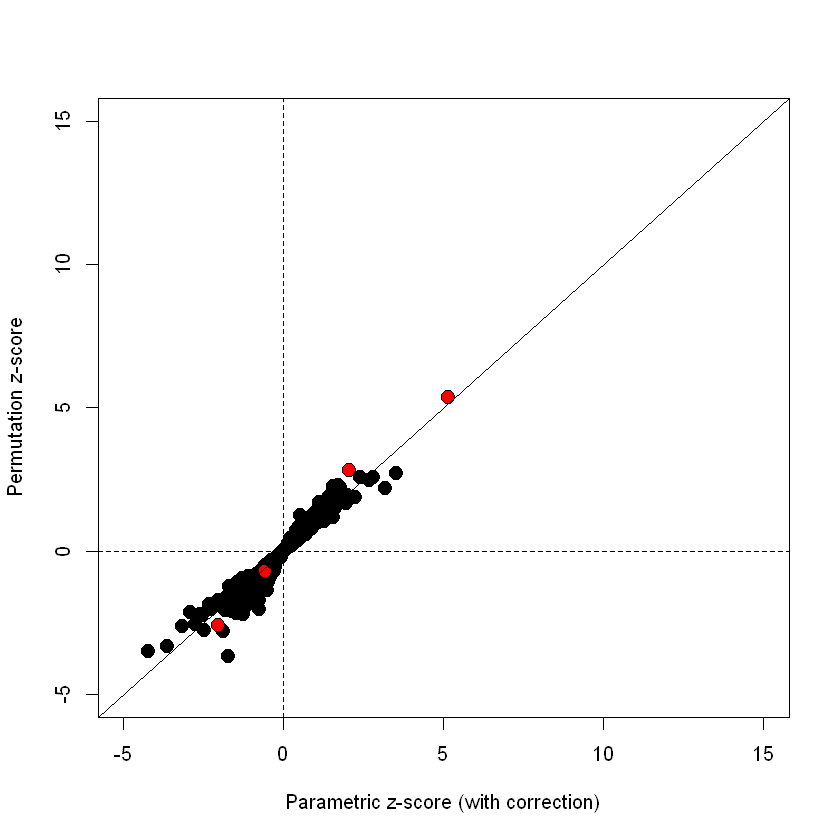

In [28]:
plot(correctedavgt,permavgt,bg=cols,pch=21,
      xlab="Parametric z-score (with correction)",
      ylab="Permutation z-score",cex=1.5,ylim=c(-5,15),xlim=c(-5,15))
abline(0,1)
abline(h=0,v=0,lty=2)

In [29]:
tab <- data.frame(avgt=p.adjust(signif(2*pnorm(1-abs(avgt)),2),method="BH"),
                  correctedavgt=p.adjust(signif(2*pnorm(1-abs(correctedavgt)),2),method="BH"),
                  permutations=p.adjust(permpval,method="BH"))
##include only gene sets with 10 or more genes in comparison
tab<-tab[N>=10,]
tab <- cbind(signif(tab,2),apply(tab,2,rank))
tab<-tab[order(tab[,1]),]
tab <- tab[tab[,1]< 0.25,]
tab

,avgt,correctedavgt,permutations,avgt,correctedavgt,permutations
chryp11,1.9e-60,1.5e-37,0,1,1,4
chryq11,4.2e-44,0.063,0,2,3,4
chrxq13,2.4e-06,0.0053,0,3,2,4
chr17p13,0.025,1,0,4.5,124,4
chr6p22,0.025,1,0.77,4.5,124,114
chrxp11,0.034,1,0.7,6,124,78
chr20p13,0.056,0.097,0,7,4,4
chr4q35,0.097,1,0.39,8,124,18


- permutation test 접근방법의 한가지 한계점은 매우 작은 p-value을 평가하기 위해서는 많은 permutations이 필요하다는 것임.
- 예를 들면, 10의 -5승  와 10의 -6승의 사이의 p-value을 구별하기 위해서는 permutations을 1,000,000 번을 수행이 필요함.
- 보수적인 다증 비교 보정을 적용하기 위해서는 더 많은 시뮬레이션이 필요함.
- 다른 한계은 많은 인자와 공변량이 많은 실험에서는 좀더 복잡한 분석디자인이 필요하고, permutation을 수행하기가 어렵움.